In [1]:
from dataclasses import dataclass
from os import stat
from typing import Any, Callable, Optional, Tuple
import jax

from IPython import get_ipython

print(jax.devices())


@dataclass
class Config:
    batch_size: int = 32
    epochs: int = 500
    total_samples: int = 5_000_000
    lr: float = 1e-3
    timesteps: int = 1000
    schedule_exponent: float = 2.0
    loss_type: str = "mae"
    dataset: str = "mnist"
    time_per_epoch: float = 10 * 60.0

    @property
    def steps_per_epoch(self) -> int:
        return self.total_samples // (self.epochs * self.batch_size)

    @property
    def total_steps(self) -> int:
        return self.total_samples // self.batch_size


config = Config()

[TpuDevice(id=0, process_index=0, coords=(0,0,0), core_on_chip=0), TpuDevice(id=1, process_index=0, coords=(0,0,0), core_on_chip=1), TpuDevice(id=2, process_index=0, coords=(1,0,0), core_on_chip=0), TpuDevice(id=3, process_index=0, coords=(1,0,0), core_on_chip=1), TpuDevice(id=4, process_index=0, coords=(0,1,0), core_on_chip=0), TpuDevice(id=5, process_index=0, coords=(0,1,0), core_on_chip=1), TpuDevice(id=6, process_index=0, coords=(1,1,0), core_on_chip=0), TpuDevice(id=7, process_index=0, coords=(1,1,0), core_on_chip=1)]


In [2]:

if not get_ipython():
    import sys

    from absl import flags
    from ml_collections import config_flags

    config_flag = config_flags.DEFINE_config_dataclass("config", config)
    flags.FLAGS(sys.argv)
    config = config_flag.value


def show_interactive():
    if not get_ipython():
        plt.ion()
        plt.pause(1)
        plt.ioff()
    else:
        plt.show()

In [3]:

import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
from datasets.load import load_dataset
import tensorflow as tf


def get_data(dataset: str, batch_size: int):
    if dataset == "mnist":
        hfds = load_dataset("mnist", split="train")
        X = np.stack(hfds["image"])[..., None]
        ds = tf.data.Dataset.from_tensor_slices(X.astype(np.float32))
    elif dataset == "cartoonset":
        hfds = load_dataset("cgarciae/cartoonset", "10k", split="train")
        ds = tf.data.Dataset.from_generator(
            lambda: hfds,
            output_signature={
                "img_bytes": tf.TensorSpec(shape=(), dtype=tf.string),
            },
        )

        def process_fn(x):
            x = tf.image.decode_png(x["img_bytes"], channels=3)
            # x = tf.image.convert_image_dtype(x, tf.float32)
            x = tf.cast(x, tf.float32)
            x = tf.image.resize(x, (64 + 16, 64 + 16))
            return x

        ds = ds.map(process_fn)
    else:
        raise ValueError(f"Unknown dataset {dataset}")

    # scale betwee -1 and 1
    ds = ds.map(lambda x: x / 127.5 - 1.0)
    ds = ds.repeat()
    ds = ds.shuffle(seed=42, buffer_size=1_000)
    ds = ds.batch(batch_size, drop_remainder=True)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds


ds = get_data("cartoonset", config.batch_size)

/home/cris/simple-ddpm/.venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


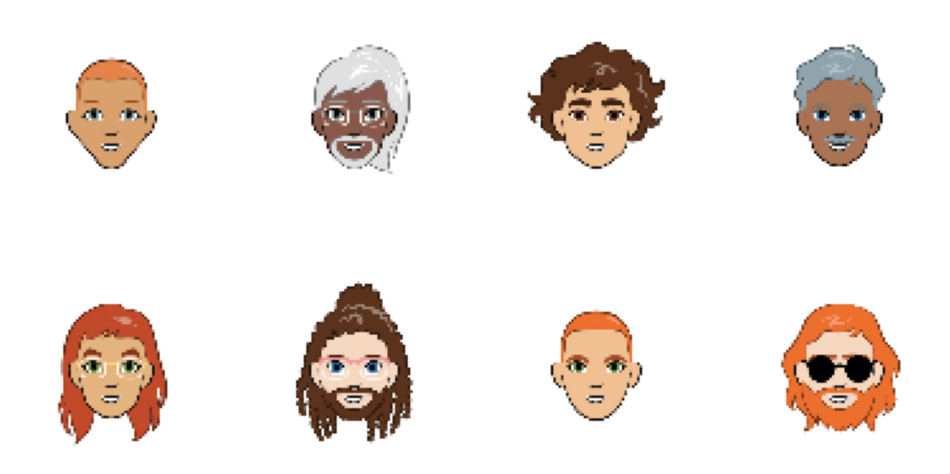

In [4]:
def render_image(x, ax=None):
    if ax is None:
        ax = plt.gca()

    if x.shape[-1] == 1:
        x = x[..., 0]
        cmap = "gray"
    else:
        cmap = None
    x = (x / 2.0 + 0.5) * 255
    x = np.clip(x, 0, 255).astype(np.uint8)
    # ax.imshow(255 - x, cmap="gray")
    ax.imshow(x, cmap=cmap)
    ax.axis("off")


x_sample = ds.as_numpy_iterator().next()
num_channels = x_sample.shape[-1]
_, axs_diffusion = plt.subplots(2, 4, figsize=(12, 6))
for col, ax in enumerate(axs_diffusion.flatten()):
    render_image(x_sample[col], ax=ax)

show_interactive()

In [5]:
from flax.struct import PyTreeNode


def expand_to(a, b):
    new_shape = a.shape + (1,) * (b.ndim - a.ndim)
    return a.reshape(new_shape)


class GaussianDiffusion(PyTreeNode):
    betas: jnp.ndarray
    alphas: jnp.ndarray
    alpha_bars: jnp.ndarray

    @classmethod
    def create(cls, betas: jnp.ndarray) -> "GaussianDiffusion":
        return cls(
            betas=betas,
            alphas=1.0 - betas,
            alpha_bars=jnp.cumprod(1.0 - betas),
        )


@jax.jit
def forward_diffusion(process, key, x0, t):
    alpha_bars = expand_to(process.alpha_bars[t], x0)
    noise = jax.random.normal(key, x0.shape)
    xt = jnp.sqrt(alpha_bars) * x0 + jnp.sqrt(1.0 - alpha_bars) * noise
    return xt, noise

In [6]:
def polynomial_schedule(beta_start, beta_end, timesteps, exponent=2.0, **kwargs):
    betas = jnp.linspace(0, 1, timesteps) ** exponent
    return betas * (beta_end - beta_start) + beta_start


def sigmoid_schedule(beta_start, beta_end, timesteps, **kwargs):
    betas = jax.nn.sigmoid(jnp.linspace(-6, 6, timesteps))
    return betas * (beta_end - beta_start) + beta_start


def cosine_schedule(beta_start, beta_end, timesteps, s=0.008, **kwargs):
    x = jnp.linspace(0, timesteps, timesteps + 1)
    ft = jnp.cos(((x / timesteps) + s) / (1 + s) * jnp.pi * 0.5) ** 2
    alphas_cumprod = ft / ft[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    betas = jnp.clip(betas, 0.0001, 0.9999)
    betas = (betas - betas.min()) / (betas.max() - betas.min())
    return betas * (beta_end - beta_start) + beta_start

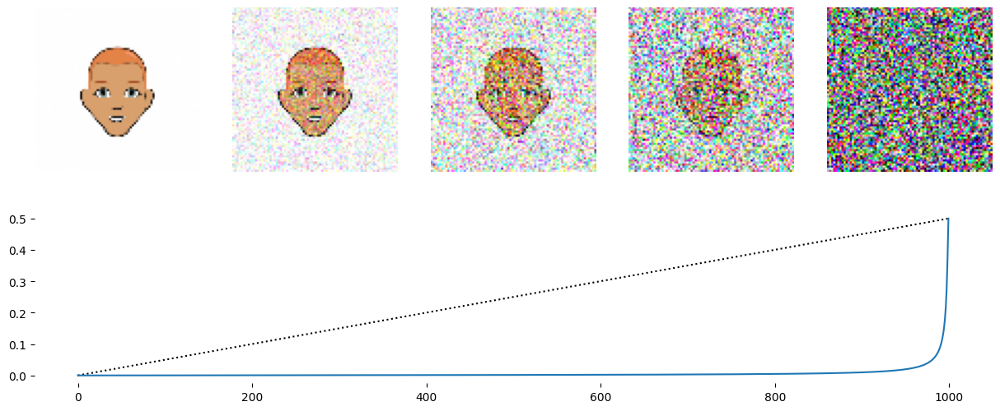

In [7]:
betas = cosine_schedule(1e-5, 0.5, config.timesteps, exponent=config.schedule_exponent)
# betas = polynomial_schedule(1e-5, 1e-2, config.timesteps, exponent=2)
process = GaussianDiffusion.create(betas)

plt.figure(figsize=(15, 6))
for col, ti in enumerate(jnp.linspace(0, config.timesteps, 5).astype(int)):
    t = jnp.full((1,), ti)
    xt, noise = forward_diffusion(process, jax.random.PRNGKey(ti), x_sample[:1], t)
    ax = plt.subplot(2, 5, col + 1)
    render_image(xt[col], ax=ax)
    plt.axis("off")

plt.subplot(2, 1, 2)
linear = polynomial_schedule(betas.min(), betas.max(), config.timesteps, exponent=1.0)
plt.plot(linear, label="linear", color="black", linestyle="dotted")
plt.plot(betas)
for s in ["top", "bottom", "left", "right"]:
    plt.gca().spines[s].set_visible(False)

show_interactive()

In [8]:
from flax.training.train_state import TrainState
from flax.struct import field


class EMA(PyTreeNode):
    mu: float = field(pytree_node=False, default=0.999)
    params: Optional[Any] = None
    step: Optional[jnp.ndarray] = None

    def init(self, params) -> "EMA":
        return self.replace(params=params, step=jnp.array(0, dtype=jnp.int32))

    def update(self, new_params) -> Tuple[Any, "EMA"]:
        if self.params is None or self.step is None:
            raise ValueError("EMA must be initialized")

        updates = jax.tree_map(self._ema, self.params, new_params)
        return updates, self.replace(params=updates, step=self.step + 1)

    def _ema(self, params, new_params):
        return self.mu * params + (1.0 - self.mu) * new_params


class State(TrainState):
    ema: EMA

    @classmethod
    def create(cls, *, apply_fn, params, tx, ema: EMA, **kwargs):
        return super().create(
            apply_fn=apply_fn, params=params, tx=tx, ema=ema.init(params), **kwargs
        )

    def apply_gradients(self, *, grads, **kwargs):
        self = super().apply_gradients(grads=grads, **kwargs)
        params, ema = self.ema.update(self.params)
        return self.replace(params=params, ema=ema)

In [9]:
import optax

from jax_metrics.metrics import Mean, Metrics
from models.unet_lucid import UNet
from models.simple_cnn import SimpleCNN
from models.simple_unet import SimpleUNet
from models.mlp_mixer import MLPMixer
from models.unet_stable import UNet2DModule, UNet2DConfig

# module = SimpleUNet(units=64, emb_dim=32)
# module = SimpleCNN(128)
# module = MLPMixer(
#     patch_size=4,
#     hidden_size=64,
#     mix_patch_size=512,
#     mix_hidden_size=512,
#     num_blocks=4,
#     num_steps=config.timesteps,
# )
# module = Mixer2D(64, 128, (1, 1), 4)
module = UNet2DModule(
    UNet2DConfig(
        out_channels=num_channels,
        down_block_types=(
            "DownBlock2D",
            "DownBlock2D",
            "DownBlock2D",
            "CrossAttnDownBlock2D",
        ),
        up_block_types=(
            "CrossAttnUpBlock2D",
            "DownBlock2D",
            "UpBlock2D",
            "UpBlock2D",
        ),
        block_out_channels=(
            128,
            128,
            128,
            128,
        ),
        cross_attention_dim=128,
    )
)
# module = UNet(dim=64, dim_mults=(1, 2, 4), channels=num_channels)
variables = module.init(jax.random.PRNGKey(42), x_sample[:1], jnp.array([0]))
tx = optax.chain(
    # optax.clip_by_global_norm(1.0),
    optax.adamw(
        optax.piecewise_constant_schedule(
            config.lr,
            {
                int(config.total_steps / 3): 0.1,
                int(config.total_steps * 2 / 3): 0.1,
            },
        )
    ),
)
state = State.create(
    apply_fn=module.apply, params=variables["params"], tx=tx, ema=EMA(mu=0.9)
)
metrics = Metrics(Mean(name="loss").map_arg(loss="values")).init()

print(module.tabulate(jax.random.PRNGKey(42), x_sample[:1], jnp.array([0]), depth=1))

                           UNet2DModule Summary                           
┏━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ path           ┃ outputs                  ┃ params                     ┃
┡━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ Inputs         │ - float32[1,80,80,3]     │                            │
│                │ - int32[1]               │                            │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ conv_in        │ float32[1,80,80,128]     │ bias: float32[128]         │
│                │                          │ kernel: float32[3,3,3,128] │
│                │                          │                            │
│                │                          │ 3,584 (14.3 KB)            │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ conv_norm_out  │ float32[1,80,80,128]     │ bias: float32[128]         │
│                │                          │ scale: float32[128]        │
│                │                          │                            │
│                │                          │ 256 (1.0 KB)               │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ conv_out       │ float32[1,80,80,3]       │ bias: float32[3]           │
│                │                          │ kernel: float32[3,3,128,3] │
│                │                          │                            │
│                │                          │ 3,459 (13.8 KB)            │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ down_blocks_0  │ - float32[1,40,40,128]   │ 870,272 (3.5 MB)           │
│                │ - - float32[1,80,80,128] │                            │
│                │   - float32[1,80,80,128] │                            │
│                │   - float32[1,40,40,128] │                            │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ down_blocks_1  │ - float32[1,20,20,128]   │ 870,272 (3.5 MB)           │
│                │ - - float32[1,40,40,128] │                            │
│                │   - float32[1,40,40,128] │                            │
│                │   - float32[1,20,20,128] │                            │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ down_blocks_2  │ - float32[1,10,10,128]   │ 870,272 (3.5 MB)           │
│                │ - - float32[1,20,20,128] │                            │
│                │   - float32[1,20,20,128] │                            │
│                │   - float32[1,10,10,128] │                            │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ down_blocks_3  │ - float32[1,10,10,128]   │ 1,317,120 (5.3 MB)         │
│                │ - - float32[1,10,10,128] │                            │
│                │   - float32[1,10,10,128] │                            │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ mid_block      │ float32[1,10,10,128]     │ 1,019,904 (4.1 MB)         │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ time_embedding │ float32[1,512]           │ 328,704 (1.3 MB)           │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ time_proj      │ float32[1,128]           │                            │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ up_blocks_0    │ float32[1,20,20,128]     │ 2,665,088 (10.7 MB)        │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ up_blocks_1    │ float32[1,40,40,128]     │ 1,773,440 (7.1 MB)         │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ up_blocks_2    │ float32[1,80,80,128]     │ 1,773,440 (7.1 MB)         │
├────────────────┼──────────────────────────┼────────────────────────────┤
│ up_blocks_3    │ float3

In [10]:
from functools import partial


@jax.jit
def reverse_diffusion(process, key, x, noise_hat, t):
    betas = expand_to(process.betas[t], x)
    alphas = expand_to(process.alphas[t], x)
    alpha_bars = expand_to(process.alpha_bars[t], x)

    z = jnp.where(
        expand_to(t, x) > 0, jax.random.normal(key, x.shape), jnp.zeros_like(x)
    )
    scaled_noise = betas / jnp.sqrt(1.0 - alpha_bars) * noise_hat
    x = (x - scaled_noise) / jnp.sqrt(alphas) + jnp.sqrt(betas) * z
    return x


@partial(jax.jit, static_argnames=["return_all"])
def sample(key, x0, ts, state, process, *, return_all=True):
    keys = jax.random.split(key, len(ts))

    def scan_fn(x, inputs):
        t, key = inputs
        t = jnp.full((x.shape[0],), t)
        noise_hat = state.apply_fn({"params": state.params}, x, t)
        x = reverse_diffusion(process, key, x, noise_hat, t)
        out = x if return_all else None
        return x, out

    x, xs = jax.lax.scan(scan_fn, x0, (ts, keys))
    return xs if return_all else x

In [12]:
def loss_fn(params, xt, t, noise):
    noise_hat = state.apply_fn({"params": params}, xt, t)
    if config.loss_type == "mse":
        return jnp.mean((noise - noise_hat) ** 2)
    elif config.loss_type == "mae":
        return jnp.mean(jnp.abs(noise - noise_hat))
    else:
        raise ValueError(f"Unknown loss type {config.loss_type}")


@partial(jax.jit, donate_argnums=(2, 3))
def train_step(key, x, state, metrics, process):
    key_t, key_diffusion, key = jax.random.split(key, 3)
    t = jax.random.uniform(
        key_t, (x.shape[0],), minval=0, maxval=config.timesteps - 1
    ).astype(jnp.int32)
    xt, noise = forward_diffusion(process, key_diffusion, x, t)
    loss, grads = jax.value_and_grad(loss_fn)(state.params, xt, t, noise)
    state = state.apply_gradients(grads=grads)
    metrics = metrics.update(loss=loss)
    logs = metrics.compute()
    return logs, key, state, metrics

[TpuDevice(id=0, process_index=0, coords=(0,0,0), core_on_chip=0), TpuDevice(id=1, process_index=0, coords=(0,0,0), core_on_chip=1), TpuDevice(id=2, process_index=0, coords=(1,0,0), core_on_chip=0), TpuDevice(id=3, process_index=0, coords=(1,0,0), core_on_chip=1), TpuDevice(id=4, process_index=0, coords=(0,1,0), core_on_chip=0), TpuDevice(id=5, process_index=0, coords=(0,1,0), core_on_chip=1), TpuDevice(id=6, process_index=0, coords=(1,1,0), core_on_chip=0), TpuDevice(id=7, process_index=0, coords=(1,1,0), core_on_chip=1)]


  0%|                                                                                                              | 0/156250 [00:00<?, ?step/s]


step: 0 None


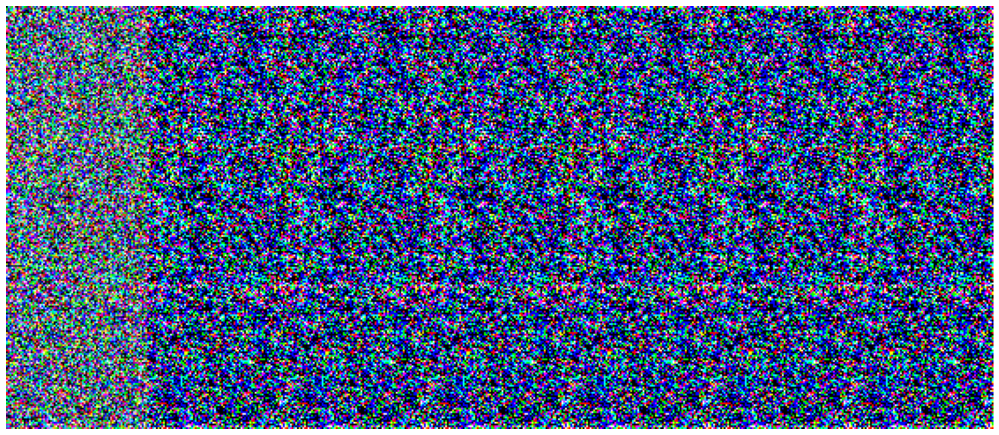

  3%|██▌                                                                                              | 4112/156250 [10:00<5:21:42,  7.88step/s]


step: 4112 {'loss': DeviceArray(0.10410852, dtype=float32)}


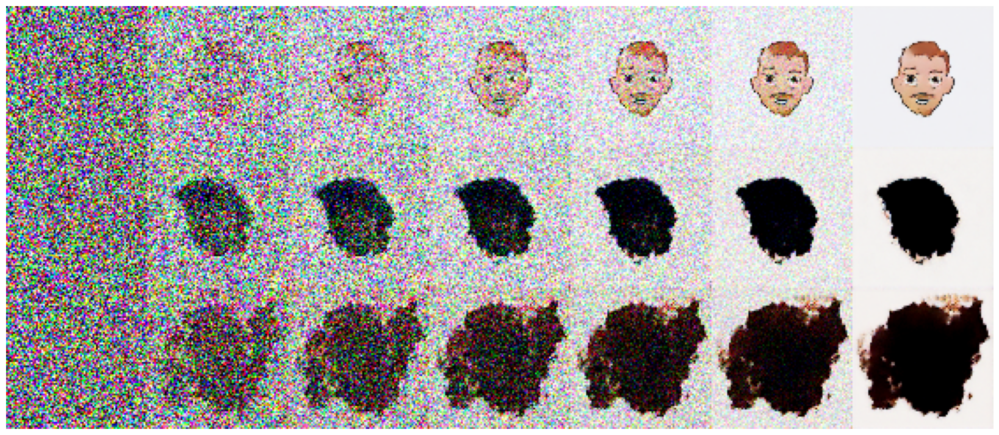

  6%|█████▍                                                                                           | 8782/156250 [20:00<5:11:47,  7.88step/s]


step: 8782 {'loss': DeviceArray(0.0613824, dtype=float32)}


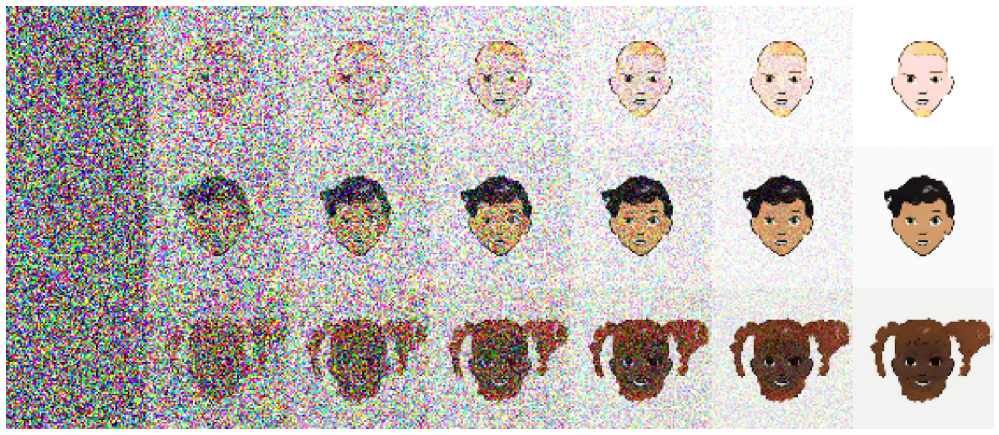

  6%|██████                                                                                           | 9804/156250 [22:17<5:09:55,  7.88step/s]

In [ ]:
import numpy as np
from pkbar import Kbar
from einop import einop
from tqdm import tqdm
from time import time


class Timer:
    def __init__(self, period: float):
        self.period = period
        self.t0 = None

    def is_ready(self):
        t = time()
        if self.t0 is None or t - self.t0 > self.period:
            self.t0 = t
            return True
        else:
            return False


print(jax.devices())

key = jax.random.PRNGKey(42)
axs_diffusion = None
axs_samples = None
ds_iterator = ds.as_numpy_iterator()
epoch_timer = Timer(config.time_per_epoch)
logs = None

for step in tqdm(range(config.total_steps), total=config.total_steps, unit="step"):

    if epoch_timer.is_ready():
        # --------------------
        # visualize progress
        # --------------------
        print()  # newline
        print(f"step: {step}", logs)
        n_rows = 3
        n_cols = 7
        viz_key = jax.random.PRNGKey(0)
        x = jax.random.normal(viz_key, (n_rows, *x_sample.shape[1:]))

        ts = jnp.arange(config.timesteps)[::-1]
        xs = np.asarray(sample(viz_key, x, ts, state, process))
        # xs = np.concatenate([x[None], xs], axis=0)
        xs = xs[np.linspace(0, len(xs) - 1, n_cols).astype(int)]
        xs = einop(xs, "col row h w c -> (row h) (col w) c", row=n_rows, col=n_cols)

        if axs_diffusion is None or get_ipython():
            plt.figure(figsize=(3 * n_cols, 3 * n_rows))
            axs_diffusion = plt.gca()

        axs_diffusion.clear()
        render_image(xs, axs_diffusion)
        axs_diffusion.axis("off")
        show_interactive()
        # ------------------------
        # reset epoch
        # ------------------------
        metrics = metrics.reset()

    x = ds_iterator.next()
    logs, key, state, metrics = train_step(key, x, state, metrics, process)

In [ ]:
from einop import einop

n_rows = 4
n_cols = 5
viz_key = jax.random.PRNGKey(1)
x = jax.random.normal(viz_key, (n_rows * n_cols, *x_sample.shape[1:]))

ts = jnp.arange(config.timesteps)[::-1]
xf = np.asarray(sample(viz_key, x, ts, state, process, return_all=False))
xf = einop(xf, "(row col) h w c -> (row h) (col w) c", row=n_rows, col=n_cols)

plt.figure(figsize=(3 * n_cols, 3 * n_rows))
render_image(xf)
plt.axis("off")
show_interactive()

In [ ]:

from base64 import b64encode
from pathlib import Path
from tempfile import TemporaryDirectory

from IPython.display import HTML, display
from matplotlib import animation


def plot_trajectory_2d(
    xs: np.ndarray,
    interval: int = 10,
    repeat_delay: int = 1000,
    step_size: int = 1,
    end_pad: int = 500,
):

    xs = xs[::step_size]

    # replace last sample to create a 'pause' effect
    pad_end = einop(xs[-1], "... -> batch ...", batch=end_pad)
    xs = np.concatenate([xs, pad_end], axis=0)

    N = len(xs)

    fig = plt.figure()
    scatter = plt.scatter(xs[0][:, 0], xs[0][:, 1], s=1)

    def animate(i):
        scatter.set_offsets(xs[i])
        return [scatter]

    anim = animation.FuncAnimation(
        fig,
        animate,
        init_func=lambda: animate(0),
        frames=np.linspace(0, N - 1, N, dtype=int),
        interval=interval,
        repeat_delay=repeat_delay,
        blit=True,
    )

    if get_ipython():
        with TemporaryDirectory() as tmpdir:
            img_name = Path(tmpdir) / f"diffusion.gif"
            anim.save(str(img_name), writer="pillow", fps=60)
            image_bytes = b64encode(img_name.read_bytes()).decode("utf-8")

        display(HTML(f"""<img src='data:image/gif;base64,{image_bytes}'>"""))
    else:
        pass

    return anim

In [ ]:

x = jax.random.normal(key, (1000, 2), minval=-1, maxval=1)
ts = jnp.arange(config.timesteps)[::-1]
xs = sample(key, x, ts, state, process)

if get_ipython():
    anim = plot_trajectory_2d(xs, step_size=2)
else:
    anim = plot_trajectory_2d(
        xs, step_size=2, interval=100, repeat_delay=1000, end_pad=0
    )

In [ ]:


def plot_density(model_fn: Callable[[Any, Any], Any], ts):
    x = jnp.linspace(-1, 1, 100)
    y = jnp.linspace(-1, 1, 100)
    xx, yy = jnp.meshgrid(x, y)
    X = jnp.stack([xx, yy], axis=-1)

    def mass_fn(x, t):
        t_ = jnp.full((1,), t)
        x_ = x[None]
        noise_hat = model_fn(x_, t_)
        magnitud = jnp.linalg.norm(noise_hat, axis=-1, keepdims=False)
        mass = jnp.exp(-magnitud)
        return mass[0]

    mass_fn = jax.jit(
        jax.vmap(
            jax.vmap(jax.vmap(mass_fn, in_axes=(0, None)), in_axes=(0, None)),
            in_axes=(None, 0),
            out_axes=-1,
        )
    )
    mass = mass_fn(X, ts).mean(axis=-1)
    plt.contourf(xx, yy, mass, levels=100)

In [ ]:

plt.figure()
plot_density(
    model_fn=lambda x, t: state.apply_fn({"params": state.params}, x, t),
    ts=jnp.array([0, 10, 20]),
)
show_interactive()

In [ ]:
plt.ioff()
plt.show()